In [10]:
from fastscape.models import basic_model, sediment_model
from fastscape.processes import (RasterGrid2D, SingleFlowRouter, AdaptiveFlowRouter, UniformRectilinearGrid2D,
SurfaceTopography,DrainageArea,FlowRouter, BareRockSurface)
from minitopan.processes import FluvialNetwork
import xsimlab as xs
import xarray as xr
import numpy as np
import hvplot.xarray  # noqa
import matplotlib.pyplot as plt
import numba as nb
import math

@xs.process
class CustomSurface:
    """Initialize surface topography as a flat surface at sea-level with
    random perturbations (white noise).

    """
    shape = xs.foreign(UniformRectilinearGrid2D, 'shape')
    elevation = xs.foreign(SurfaceTopography, 'elevation', intent='out')
    input_elevation = xs.variable(
        dims=('y', 'x'),
        intent='inout',
        description='differential transport/deposition coefficient'
    )

    def initialize(self):
        self.elevation = self.input_elevation

#Selecting the model
this_model = sediment_model.update_processes({"flow":AdaptiveFlowRouter}).drop_processes('diffusion')
this_model = this_model.update_processes({"init_topography":CustomSurface})

#General param
nrows = 301
ncols = 301
length_X = 2e5
length_Y = 2e5

# foreland_N = round(6*nrows/15)
# foreland_S = round(9*nrows/15)
foreland_N = round(1*nrows/4)
foreland_S = round(3*nrows/4)


# Uplift field
uplift = xr.DataArray(np.zeros((nrows,ncols)), dims=('y', 'x'))
uplift[foreland_N:foreland_S,:] = 1e-3


#time
time = np.linspace(0., 1e7, 1000)
every = 100

in_ds = xs.create_setup(
    model=this_model,
    clocks={
        'time': time,
        'out': time[::every]
    },
    master_clock='time',
    input_vars={
        'grid': {'shape': [nrows, ncols], 'length': [length_Y, length_X]},
        'boundary__status': ['looped', 'looped', 'fixed_value', 'fixed_value'],
        'uplift__rate': uplift,
        'spl__k_coef_soil': 1e-4,
        'spl__k_coef_bedrock': 0.6e-4,
        'spl__g_coef_bedrock': 1,
        'spl__g_coef_soil': 1,
        
        'init_topography__input_elevation':SStopo,

    },
    output_vars={
        'topography__elevation': 'out',

        
    }
)

In [11]:
with this_model, xs.monitoring.ProgressBar():
    out_ds = in_ds.xsimlab.run()

In [12]:
topo = out_ds.topography__elevation.hvplot.image(
x='x', y='y', clim=(0., 1500.),
    width=550, height=450,
    cmap=plt.cm.gray, groupby='out', dynamic = False
)
SStopo = out_ds.topography__elevation.isel({'out':-1})
# SStopo.to_netcdf('SS_topo.nc')

topo

:HoloMap   [out]
   :Image   [x,y]   (topography__elevation)

In [65]:
SStopo = np.array(SStopo)

uplift_val = 10e-3

uplift_phase_2 = uplift.copy()
uplift_phase_2[foreland_N-50:foreland_N,round(ncols/3):round(ncols/3)+20] = uplift_val
uplift_phase_2[foreland_N-50:foreland_N,round(2*ncols/3)-20:round(2*ncols/3)] = uplift_val
uplift_phase_2[foreland_N-50:foreland_N-30,round(ncols/3)+20:round(2*ncols/3)-20] = uplift_val
uplift_phase_2[foreland_S:foreland_S+50,round(ncols/3):round(ncols/3)+20] = uplift_val
uplift_phase_2[foreland_S:foreland_S+50,round(2*ncols/3)-20:round(2*ncols/3)] = uplift_val
uplift_phase_2[foreland_S+30:foreland_S+50,round(ncols/3)+20:round(2*ncols/3)-20] = uplift_val

uplift_phase_2[foreland_N:foreland_S,:] = uplift_val


this_model = this_model.update_processes({"init_topography":CustomSurface})

#time
time = np.linspace(0., 2e7, 3000)
every = 20

in_ds = xs.create_setup(
    model=this_model,
    clocks={
        'time': time,
        'out': time[::every]
    },
    master_clock='time',
    input_vars={
        'grid': {'shape': [nrows, ncols], 'length': [length_Y, length_X]},
        'boundary__status': ['looped', 'looped', 'fixed_value', 'fixed_value'],
        'uplift__rate': uplift_phase_2,
        'init_topography__input_elevation':SStopo,
        'spl__k_coef_soil': 0.3e-4,
        'spl__k_coef_bedrock': 0.5e-4,
        'spl__g_coef_bedrock': 1,
        'spl__g_coef_soil': 1,

    },
    output_vars={
        'topography__elevation': 'out',

        
    }
)

In [66]:
with this_model, xs.monitoring.ProgressBar():
    out_ds = in_ds.xsimlab.run()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:HoloMap   [out]
   :Image   [x,y]   (topography__elevation)
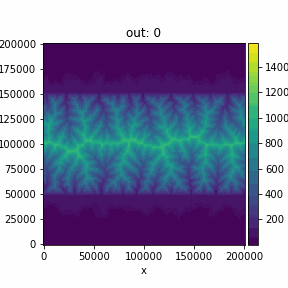

In [45]:
# import holoviews as hv
# hv.extension('matplotlib')
# %output filename="test" holomap="gif"
# %opts Image style(cmap='viridis') plot[colorbar=True]
# %opts Image [width=500, height=400]

# # topo = out_ds.topography__elevation.hvplot.image(
# # x='x', y='y', clim=(0., 2000.),
# #     width=550, height=450,#ylim = (0.5e5,2e5),
# #     cmap=plt.cm.gray, groupby='out', dynamic = False
# # )
# hv_ds = hv.Dataset(out_ds.topography__elevation)
# hv_ds.to(hv.Image, ['x', 'y'])
# print(topo)

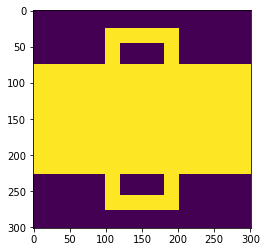

In [29]:
plt.imshow(uplift_phase_2)

In [67]:
topo = out_ds.topography__elevation.hvplot.image(
x='x', y='y', #clim=(0., 5000.),
    width=800, height=650,#ylim = (0.5e5,2e5),
    cmap=plt.cm.gray, groupby='out', dynamic = False
)
hv.save(topo, 'holomap_highU.mp4', fps=15)